### Importing Necessary Functions from Voromesh

In [1]:
# import os, time
from voromesh.voromesh2d import Geometry
from voromesh.voromesh2d import IO
from voromesh.voromesh2d import generate_poisson_points, generate_sequence_points
from voromesh.voromesh2d import lloyd_with_density as lloyd
from voromesh.voromesh2d import VoronoiGenerator, MeshOptimizer, CohesiveZoneAdjuster, TriangularMesher, triangulate_geometry
from voromesh.voromesh2d import plot_boundary_with_points, plot_voronoi_cells, plot_voronoi_edges, plot_voronoi_cells_with_short_edges, plot_triangulated_geometry, plot_error_comparison, plot_boundary_with_short_edges, plot_density_plate_with_hole, plot_density_hexagon, plot_voronoi_cells_with_gaps, create_figure_grid
from voromesh.voromesh2d import generate_variable_names, parse_input_file, computeVoronoi2d, computeVoronoi2d_fromInputFile, print_docstring, get_voronoi_stats

In [2]:
# Initialize Voronoi generators and optimizers
voronoi_generator = VoronoiGenerator(buffer_factor=1.0)
optimizer = MeshOptimizer(verbose=True)
DPI = 2400

# Analysis of Calcite Region

Loaded 1344 polygons from ./examples/CalciteBoundaryFromPNG.obj


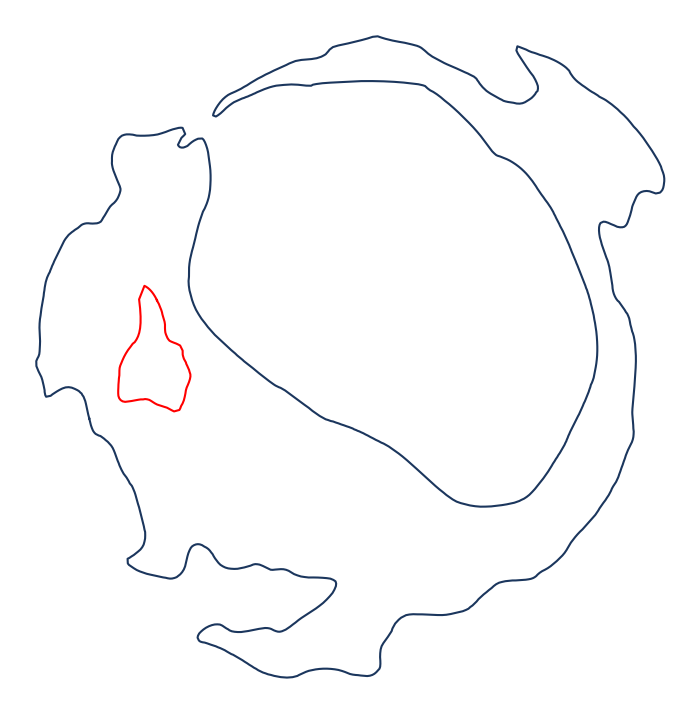

In [3]:
file_path = './examples/CalciteBoundaryFromPNG.obj'
domain = IO.load_polygon_from_file(file_path)
plot_boundary_with_points(figure_name='CalciteBoundary.eps', polygon=domain, dpi=DPI)

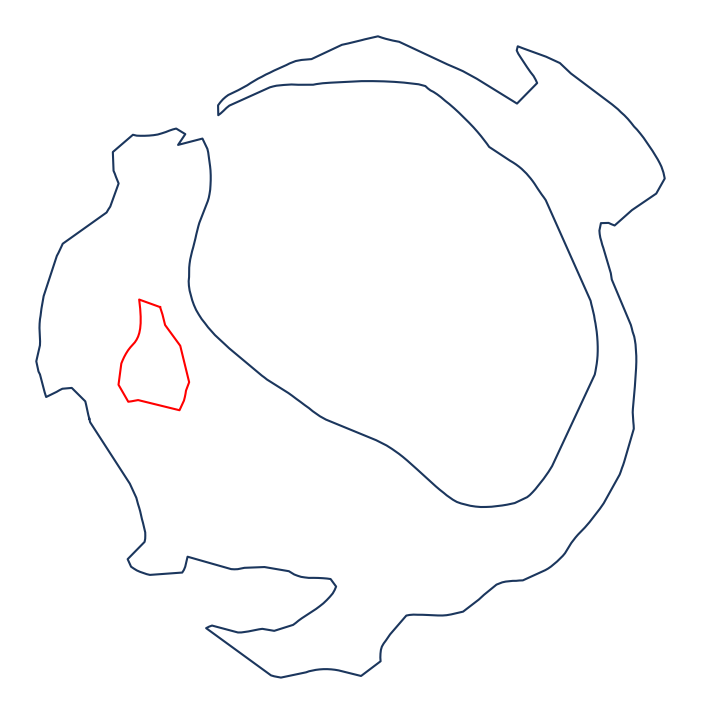

In [4]:
# print_short_boundaryEdges(domain, N=20)
optimizedDomain = optimizer.optimize_boundary(domain, threshold=10)
plot_boundary_with_points(figure_name='CalciteBoundaryOptimized.eps', polygon=optimizedDomain, dpi=DPI)

In [5]:
# Initial seed points
N_points = 1000
points_seed = 7845
poissonPoints = generate_poisson_points(domain=domain, N=N_points, seed=points_seed, margin=10)
sequencePoints = generate_sequence_points(domain=domain, N=N_points, seed=points_seed, margin=10)


Poisson Disc Sampling completed in 11.87 seconds.
Generated 1003 points (target: 1000).
Point generation using quasi-random generator completed in 0.28420 seconds.
Generated 1000 points (target: 1000).


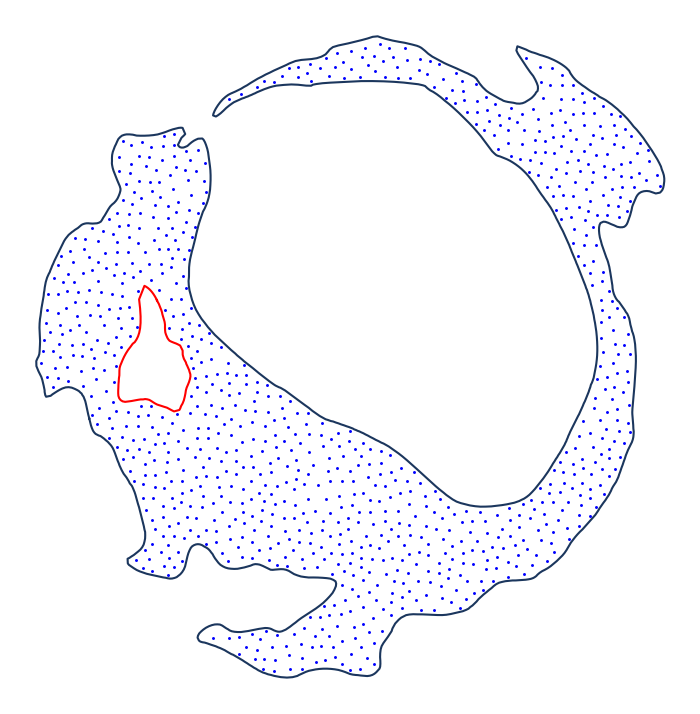

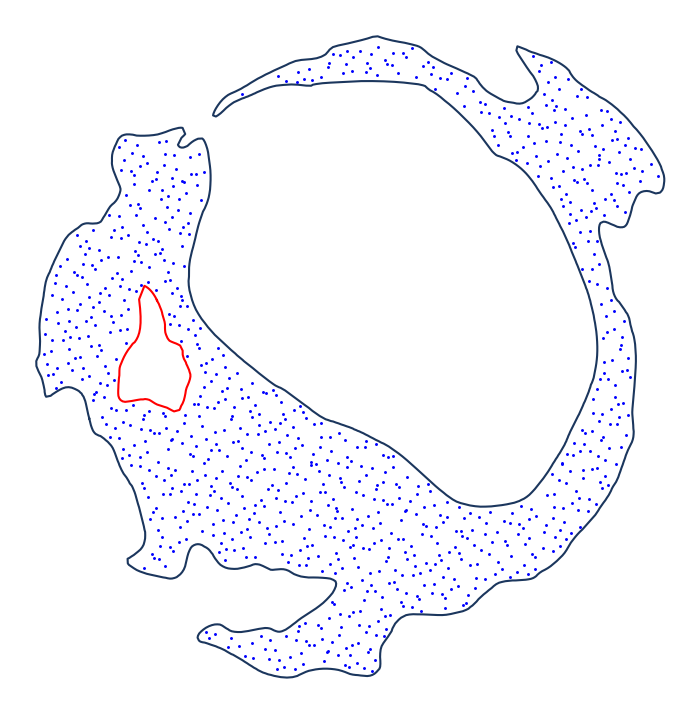

In [6]:
plot_boundary_with_points(figure_name='CalciteBoundarywithPoissonPoints.eps', polygon=domain, points=poissonPoints, dpi=DPI)
plot_boundary_with_points(figure_name='CalciteBoundarywithSequencePoints.eps', polygon=domain, points=sequencePoints, dpi=DPI)

#### Applying Lloyd without decay

In [7]:
relaxedPoissonPointsWithoutDecay, metrics_relaxedPoissonPointsWithoutDecay = lloyd(polygon=domain, seed_points=poissonPoints, density_function=None, max_iterations=10000000, tol=1e-5, use_decay=False, grad_increase_tol=1.4)

relaxedSequencePointsWithoutDecay, metrics_relaxedSequencePointsWithoutDecay = lloyd(polygon=domain, seed_points=sequencePoints, density_function=None, max_iterations=10000000, tol=1e-5, use_decay=False, grad_increase_tol=1.4)

Minimum error 3.68769e-03 found at iteration 38
Total time: 4.75728 seconds
Minimum error 5.81693e-03 found at iteration 31
Total time: 3.83279 seconds


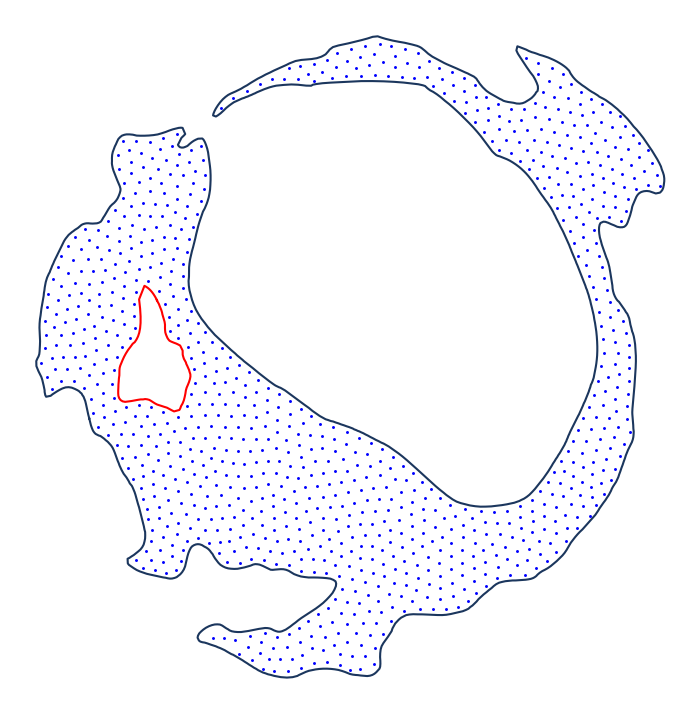

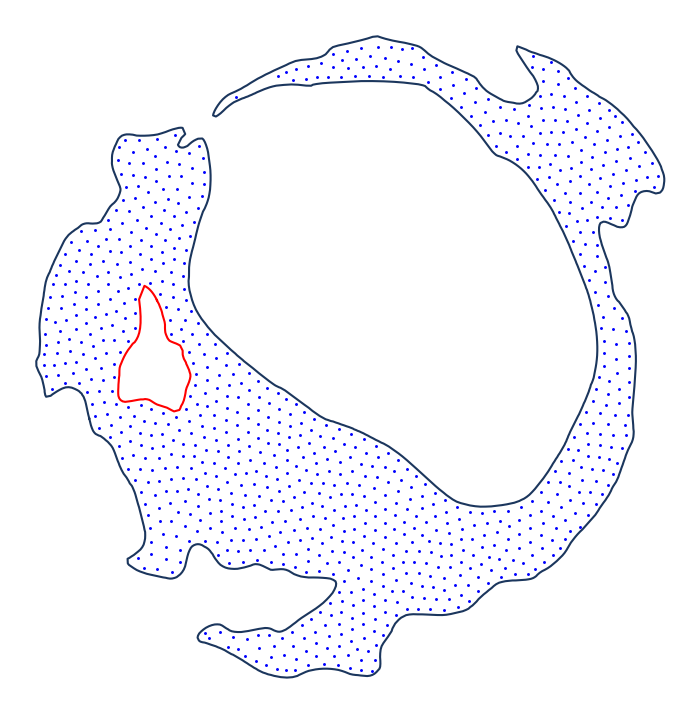

In [8]:
plot_boundary_with_points(figure_name='CalciteBoundarywithRelaxedPoissonPoints.eps', polygon=domain, points=relaxedPoissonPointsWithoutDecay, dpi=DPI)
plot_boundary_with_points(figure_name='CalciteBoundarywithRelaxedSequencePoints.eps', polygon=domain, points=relaxedSequencePointsWithoutDecay, dpi=DPI)

### Applying Lloyd with decay

In [9]:
relaxedPoissonPointsWithDecay, metrics_relaxedPoissonPointsWithDecay = lloyd(polygon=domain, seed_points=poissonPoints, density_function=None, max_iterations=10000000, tol=1e-5, use_decay=True, grad_increase_tol=1.4)

Minimum error 5.38356e-04 found at iteration 170
Total time: 19.26260 seconds


### Generating Voronoi Cells

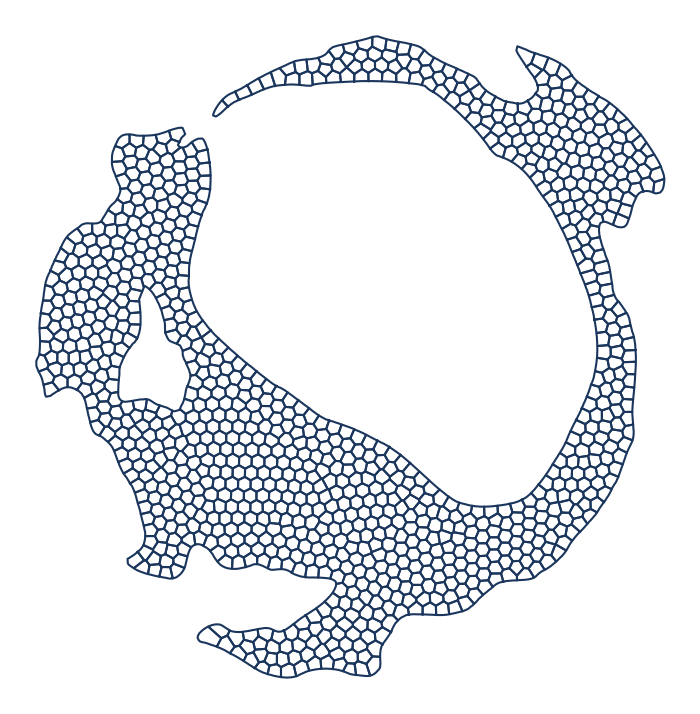

In [10]:
calcite_voronoi = voronoi_generator.generate_cells(domain=domain, points=relaxedPoissonPointsWithDecay)
plot_voronoi_cells(figure_name='calcite_voronoi.eps', voronoi_cells=calcite_voronoi, points=None, dpi=DPI)

### Optimizing Calcite Voronoi

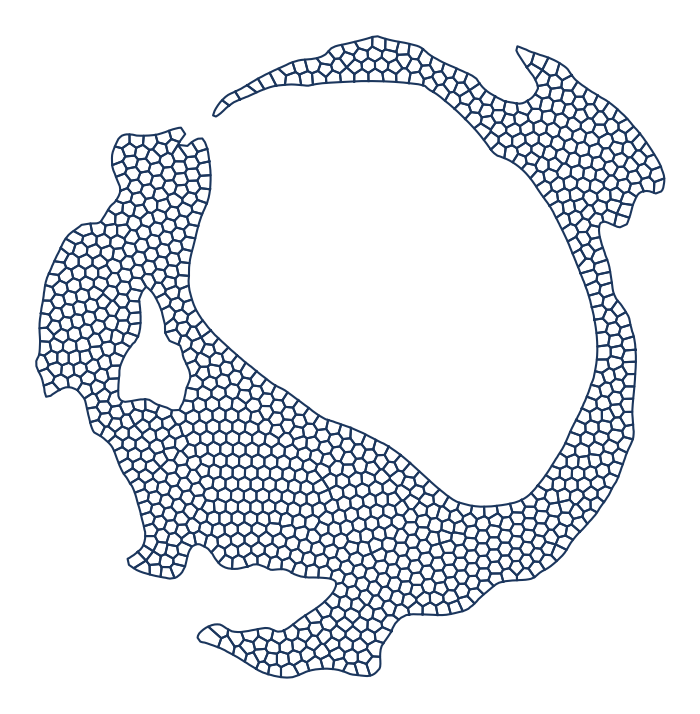

In [12]:
optimized_calciteVoronoi = optimizer.optimize_voronoi_cells(voronoi_cells=calcite_voronoi, threshold=6.3)
plot_voronoi_cells(figure_name='optimized_calciteVoronoi.eps', voronoi_cells=optimized_calciteVoronoi, dpi=DPI)

### Inserting Finite-thickness Cohesive Zone

Applied thickness: 0.2000
Achieved area ratio: 0.6400


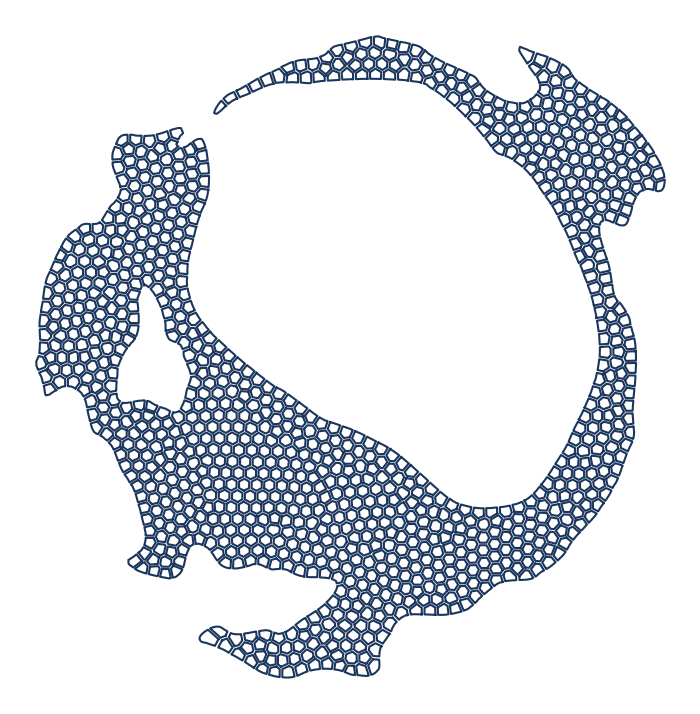

In [36]:
cohesive_adjuster = CohesiveZoneAdjuster(tolerance=0.005, max_iterations=10, verbose=True)
adjusted_calciteVoronoi = cohesive_adjuster.adjust_fixed_thickness(cells=calcite_voronoi, thickness=0.2)
plot_voronoi_cells(figure_name='adjusted_calciteVoronoi.png', voronoi_cells=adjusted_calciteVoronoi, dpi=DPI)

Saving triangular mesh to: meshFiles\calciteVoronoiTriangulated.obj
Using format 'obj' for extension 'obj'
Successfully saved triangular mesh to: meshFiles\calciteVoronoiTriangulated.obj


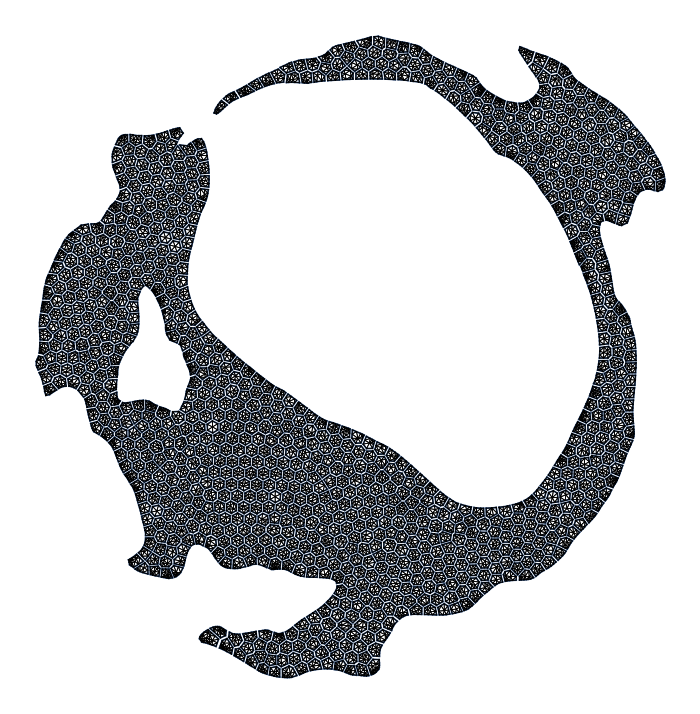

In [14]:
triangulated_calciteVoronoi = triangulate_geometry(geometry=adjusted_calciteVoronoi, min_edge_length=20.0, save_mesh=True, filename='calciteVoronoiTriangulated.obj')
plot_triangulated_geometry(geometry=adjusted_calciteVoronoi, triangulation=triangulated_calciteVoronoi, figure_name='Triangulated_calciteVoronoi.png', dpi=DPI, triangle_style='-')

### Extracting Voronoi edges

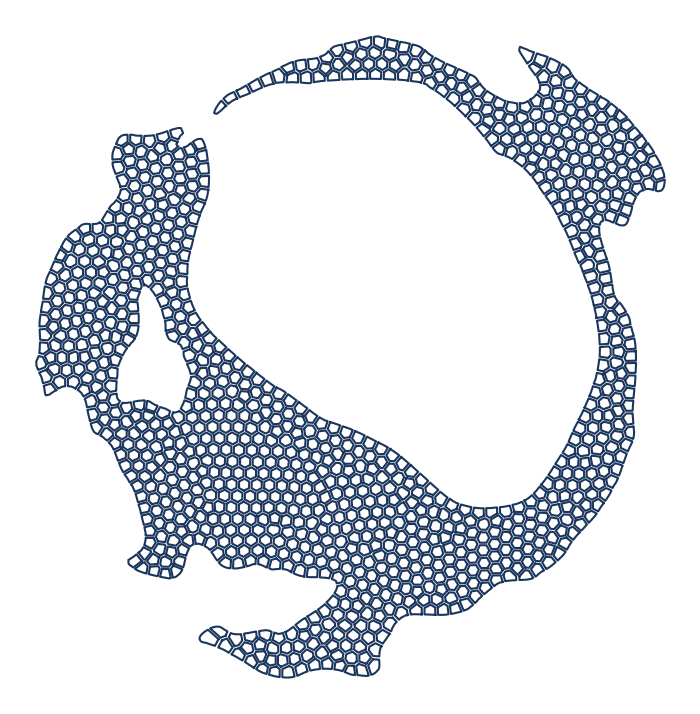

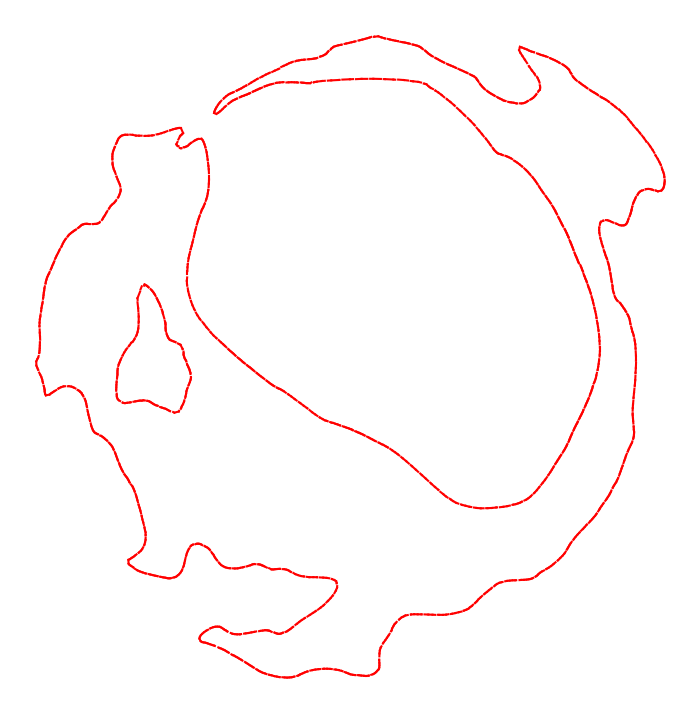

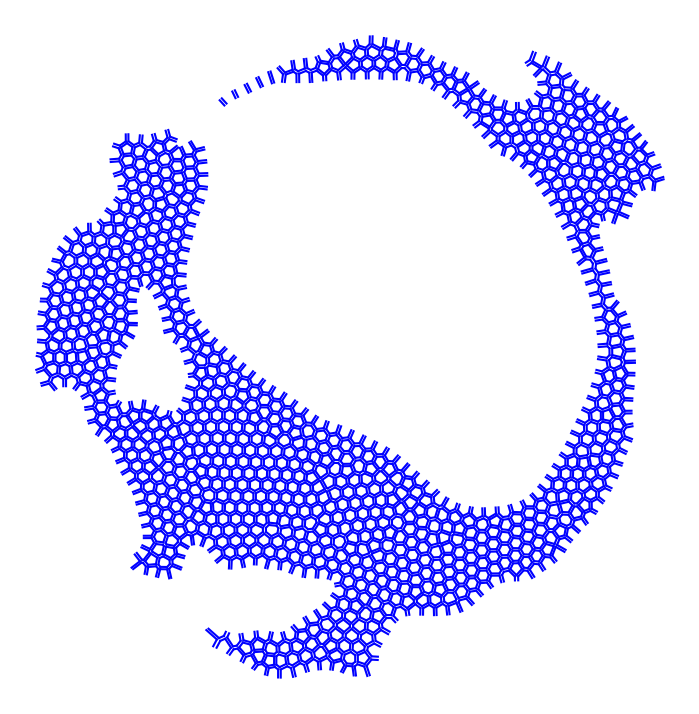

In [37]:
plot_voronoi_edges(voronoi_cells=adjusted_calciteVoronoi,base_figure='calcite_voronoiedges.eps', original_cells=calcite_voronoi, dpi=DPI)

### Generating Wrench Geometry

Loaded 60 polygons from ./examples/wrenchGeometry.obj


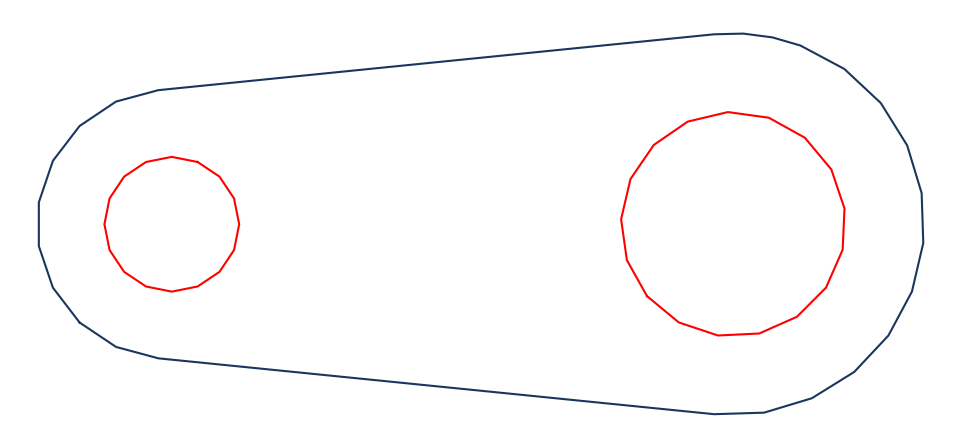

In [51]:
file_path = './examples/wrenchGeometry.obj'
wrenchBoundary = IO.load_polygon_from_file(file_path)
plot_boundary_with_points(figure_name='WrenchGeometry.eps', polygon=wrenchBoundary, dpi=DPI)

In [17]:
# Initial seed points
N_points = 500
points_seed = 7845
poissonPoints_wrench = generate_poisson_points(wrenchBoundary, N_points, points_seed, margin=0.2)
sequencePoints_wrench = generate_sequence_points(wrenchBoundary, N_points, points_seed, margin=0.2)


Poisson Disc Sampling completed in 1.54 seconds.
Generated 496 points (target: 500).
Point generation using quasi-random generator completed in 0.01808 seconds.
Generated 500 points (target: 500).


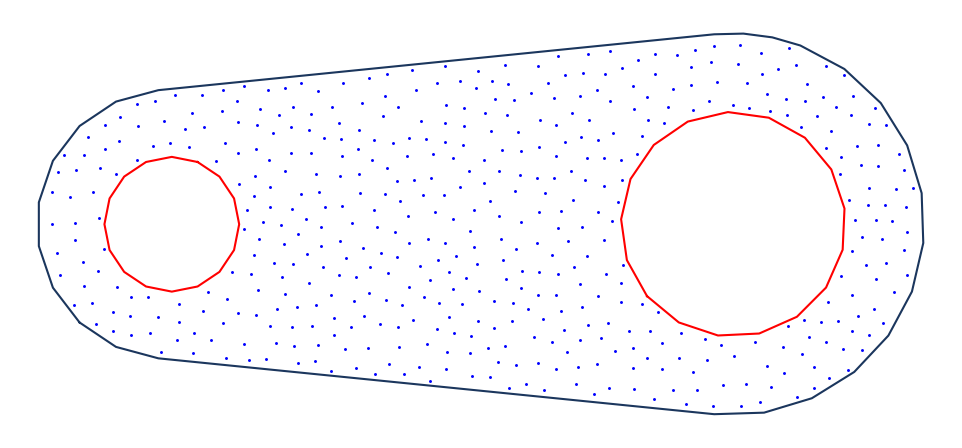

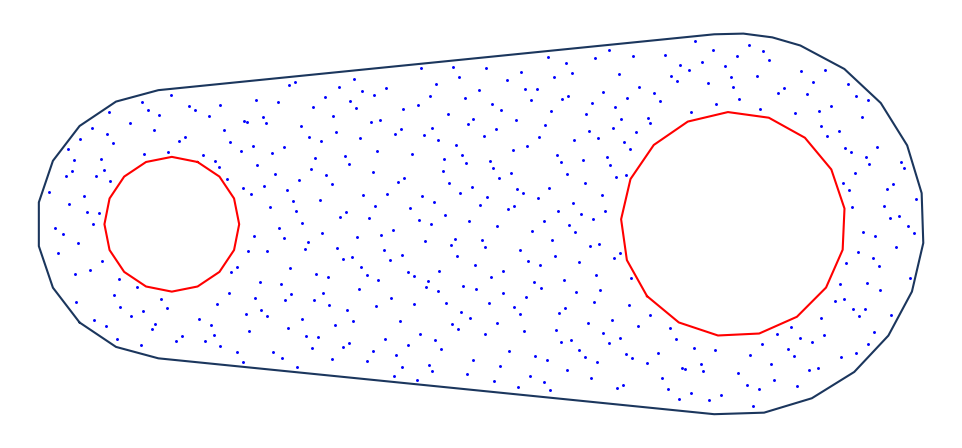

In [52]:
plot_boundary_with_points(figure_name='WrenchwithPoissonPoints.eps', polygon=wrenchBoundary, points=poissonPoints_wrench, dpi=DPI)
plot_boundary_with_points(figure_name='WrenchwithSequencePoints.eps', polygon=wrenchBoundary, points=sequencePoints_wrench, dpi=DPI)

### Before Lloyd

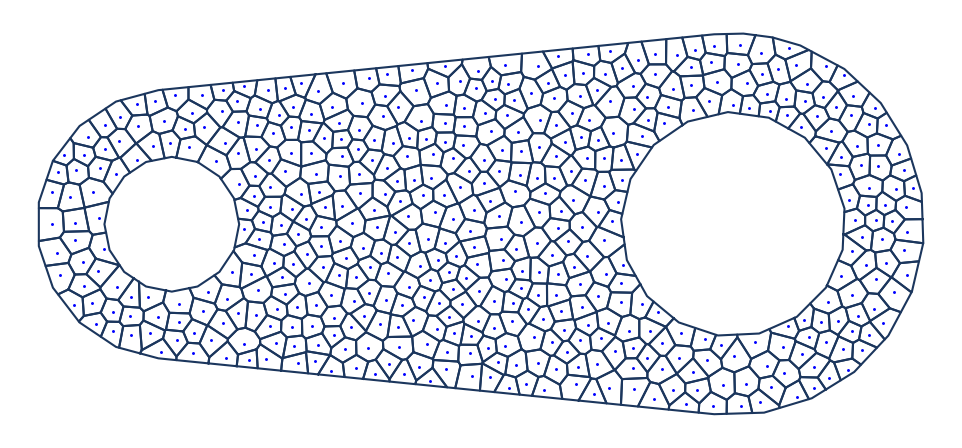

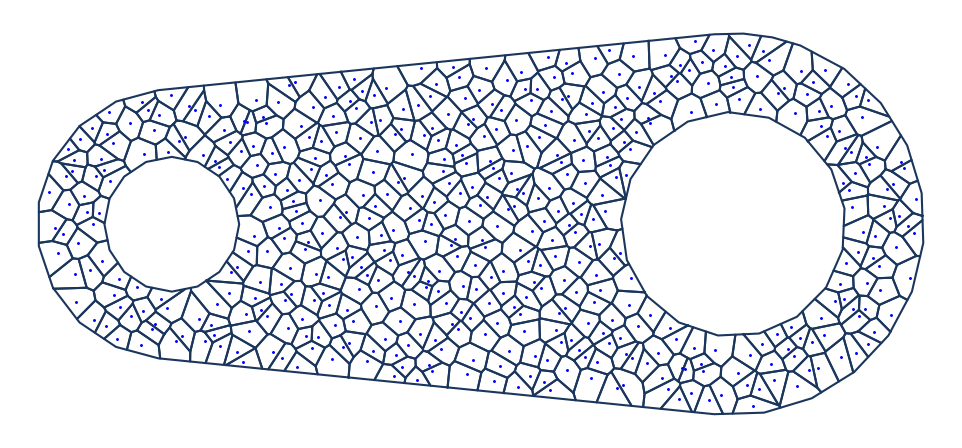

In [50]:
wrench_vorinoiPoisson = voronoi_generator.generate_cells(domain=wrenchBoundary, points=poissonPoints_wrench)
wrench_vorinoiSequence = voronoi_generator.generate_cells(domain=wrenchBoundary, points=sequencePoints_wrench)
plot_voronoi_cells(figure_name='wrench_voronoiPoisson.eps', voronoi_cells=wrench_vorinoiPoisson, points=poissonPoints_wrench, dpi=DPI)
plot_voronoi_cells(figure_name='wrench_voronoiSequence.eps', voronoi_cells=wrench_vorinoiSequence, points=sequencePoints_wrench, dpi=DPI)

### After Lloyd

In [21]:
relaxedPoissonPointsWrench, metrics_relaxedPoissonPointsWrench = lloyd(polygon=wrenchBoundary, seed_points=poissonPoints_wrench, density_function=None, max_iterations=10000000, tol=1e-5, use_decay=True, grad_increase_tol=1.5)

relaxedSequencePointsWrench, metrics_relaxedSequencePointsWrench = lloyd(polygon=wrenchBoundary, seed_points=sequencePoints_wrench, density_function=None, max_iterations=10000000, tol=1e-5, use_decay=True, grad_increase_tol=1.5)

Minimum error 7.92690e-04 found at iteration 82
Total time: 3.63838 seconds
Minimum error 7.85940e-04 found at iteration 115
Total time: 3.93656 seconds


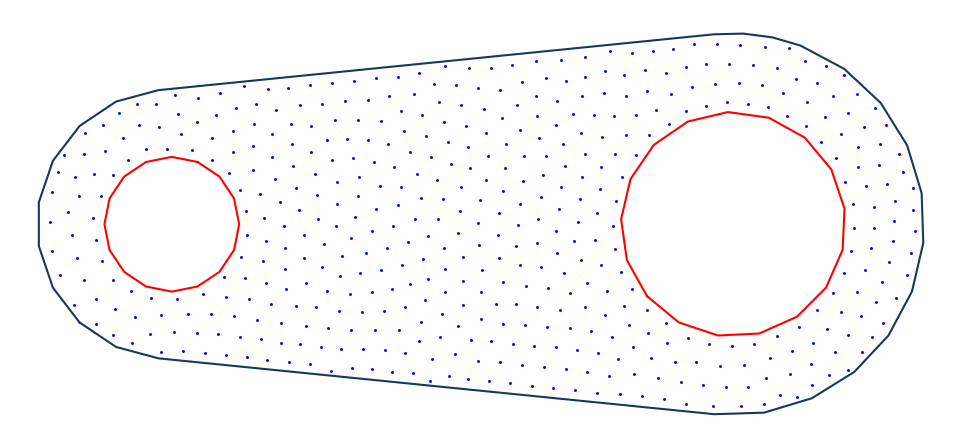

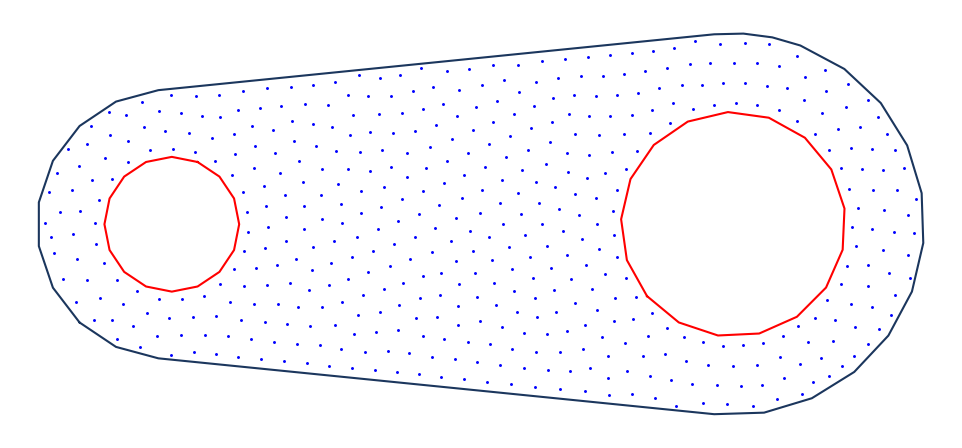

In [53]:
plot_boundary_with_points(figure_name='WrenchwithRelaxedPoissonPoints.eps', polygon=wrenchBoundary, points=relaxedPoissonPointsWrench, dpi=DPI)
plot_boundary_with_points(figure_name='WrenchwithRelaxedSequencePoints.eps', polygon=wrenchBoundary, points=relaxedSequencePointsWrench, dpi=DPI)

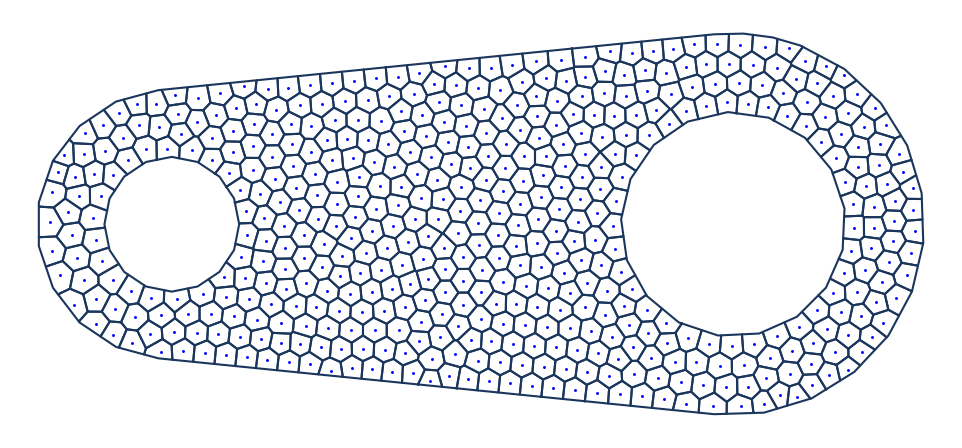

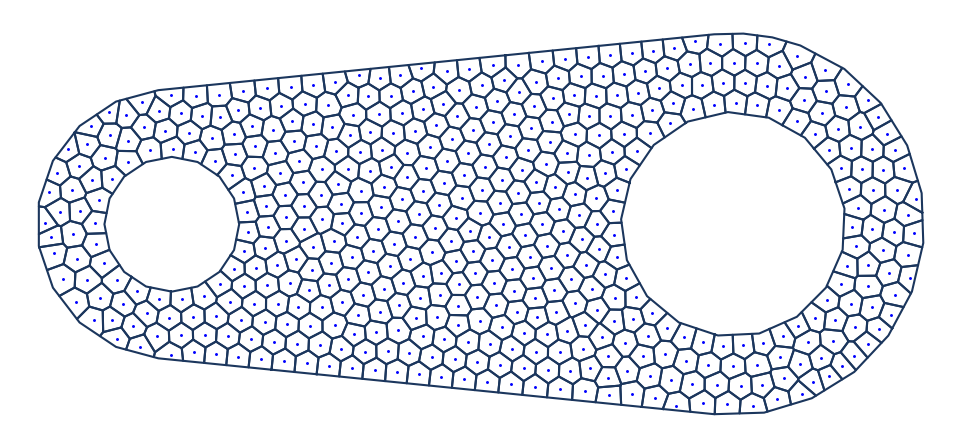

In [49]:
wrench_vorinoirelaxedPoisson = voronoi_generator.generate_cells(domain=wrenchBoundary, points=relaxedPoissonPointsWrench)

wrench_vorinoirelaxedSequence = voronoi_generator.generate_cells(domain=wrenchBoundary, points=relaxedSequencePointsWrench)

plot_voronoi_cells(figure_name='wrench_voronoirelaxedPoisson.eps', voronoi_cells=wrench_vorinoirelaxedPoisson, points=relaxedPoissonPointsWrench, dpi=DPI)

plot_voronoi_cells(figure_name='wrench_voronoirelaxedSequence.eps', voronoi_cells=wrench_vorinoirelaxedSequence, points=relaxedSequencePointsWrench, dpi=DPI)

## Analysis of plate with hole

#### The density function

In [25]:
import numpy as np
def create_circular_gradient_density(circle_center, circle_radius, 
                                   max_density=1.0, min_density=0.1, decay_rate=0.5):
    """
    Creates a density function that concentrates points around a circular region.
    
    Parameters:
    - circle_center: Tuple (x, y) for circle center
    - circle_radius: Radius of the circle
    - max_density: Maximum density value (at circle boundary)
    - min_density: Minimum density value (far from circle)
    - decay_rate: Controls how quickly density decreases with distance
    
    Returns:
    - density_function: Function that takes (x, y) and returns density value
    """
    
    def distance_to_circle(x, y):
        """Calculate the shortest distance from point (x,y) to circle boundary"""
        dist_to_center = np.sqrt((x - circle_center[0])**2 + (y - circle_center[1])**2)
        return abs(dist_to_center - circle_radius)
    
    def density_function(x, y):
        """
        Calculate density at point (x,y)
        Uses an exponential decay from the circle boundary
        """
        # Calculate distance to circle boundary
        dist = distance_to_circle(x, y)
        
        # Calculate density using exponential decay
        density = max_density * np.exp(-decay_rate * dist) + min_density
        
        # Normalize to ensure density stays within [min_density, max_density]
        density = np.clip(density, min_density, max_density)
        
        return density
    
    return density_function

In [63]:
rect_point1=(0, 0) 
rect_point2=(10, 6) 
circle_center=(5, 3)
circle_radius=1

max_density=30.0,    # Maximum density at circle boundary
min_density=5.0,    # Minimum density far from circle
decay_rate=3.0      # Controls how quickly density drops off

rect_with_hole = Geometry.rectangle_with_circular_hole(
            rect_point1=rect_point1, 
            rect_point2=rect_point2, 
            circle_center=circle_center, 
            circle_radius=circle_radius, 
            name='RectWithCentralHole'
          )

rect_with_hole_Boundary = IO.load_polygon_from_file(rect_with_hole)
# plot_boundary_with_points('RectWithHoleGeometry.png', polygon=rect_with_hole_Boundary)

Note: The circular region is completely inside the rectangular region. Creating a hole.


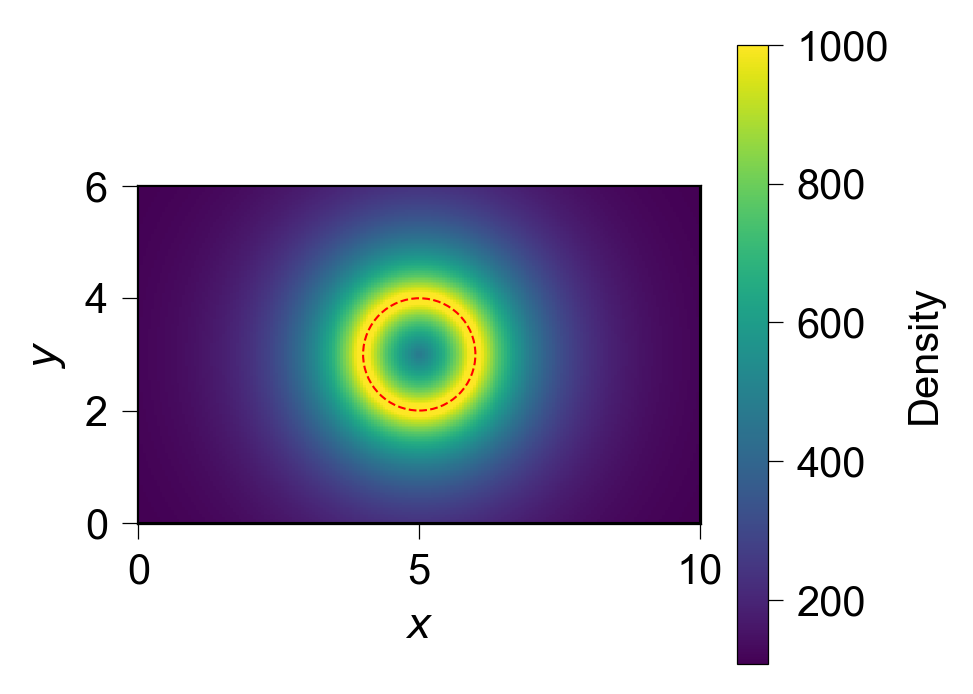

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


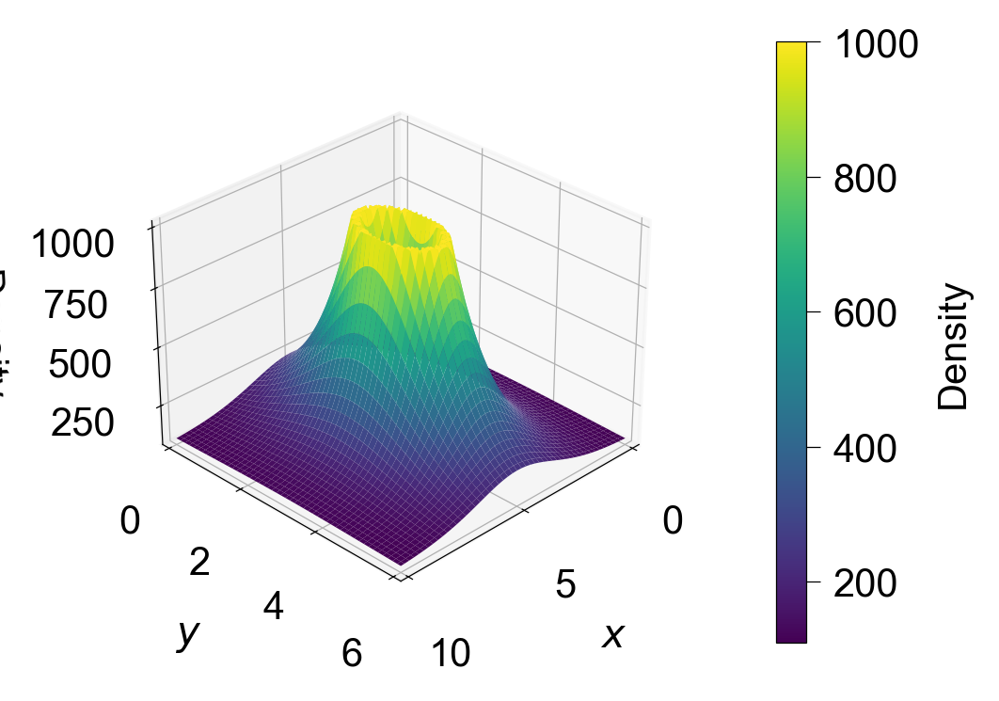

In [64]:
plot_density_plate_with_hole(rect_point1, rect_point2, circle_center, circle_radius, max_density=1000.0, min_density=100.0, decay_rate=1.0, resolution=200, figure_name='plateDensity.eps', dpi=DPI)

In [28]:
# Initial seed points
N_points = 1000
points_seed = 7845
poissonPoints_plate = generate_poisson_points(rect_with_hole_Boundary, N_points, points_seed, margin=0.05)

# plot_boundary_with_points(figure_name='PlatewithPoissonPoints.png', polygon=rect_with_hole_Boundary, points=poissonPoints_plate)


Poisson Disc Sampling completed in 3.06 seconds.
Generated 997 points (target: 1000).


In [29]:
# Run the algorithm without the density function
relaxed_pointsPlateWithoutDensity, metricsPlateWithoutDensity = lloyd(rect_with_hole_Boundary, poissonPoints_plate, density_function=None, max_iterations=10000000, tol=1e-5, use_decay=True, grad_increase_tol=1.4)

Minimum error 8.64924e-04 found at iteration 103
Total time: 7.01192 seconds


In [30]:
# Run the algorithm with the density function
relaxed_pointsPlate, metricsPlate = lloyd(rect_with_hole_Boundary, poissonPoints_plate, density_function=create_circular_gradient_density(
    circle_center=circle_center,
    circle_radius=circle_radius,
    max_density=30.0,    # Maximum density at circle boundary
    min_density=5.0,    # Minimum density far from circle
    decay_rate=3.0      # Controls how quickly density drops off
), max_iterations=10000000, tol=1e-5, use_decay=True, grad_increase_tol=1.4)

Minimum error 9.62160e-03 found at iteration 25
Total time: 207.66130 seconds


In [31]:
# Run the algorithm with the density function
relaxed_pointsPlateWithoutDecay, metricsPlateWithoutDecay = lloyd(rect_with_hole_Boundary, poissonPoints_plate, density_function=create_circular_gradient_density(
    circle_center=circle_center,
    circle_radius=circle_radius,
    max_density=1000.0,    # Maximum density at circle boundary
    min_density=100.0,    # Minimum density far from circle
    decay_rate=1.0      # Controls how quickly density drops off
), max_iterations=10000000, tol=1e-5, use_decay=False, grad_increase_tol=1.4)

Minimum error 1.50108e-03 found at iteration 698
Total time: 1944.84452 seconds


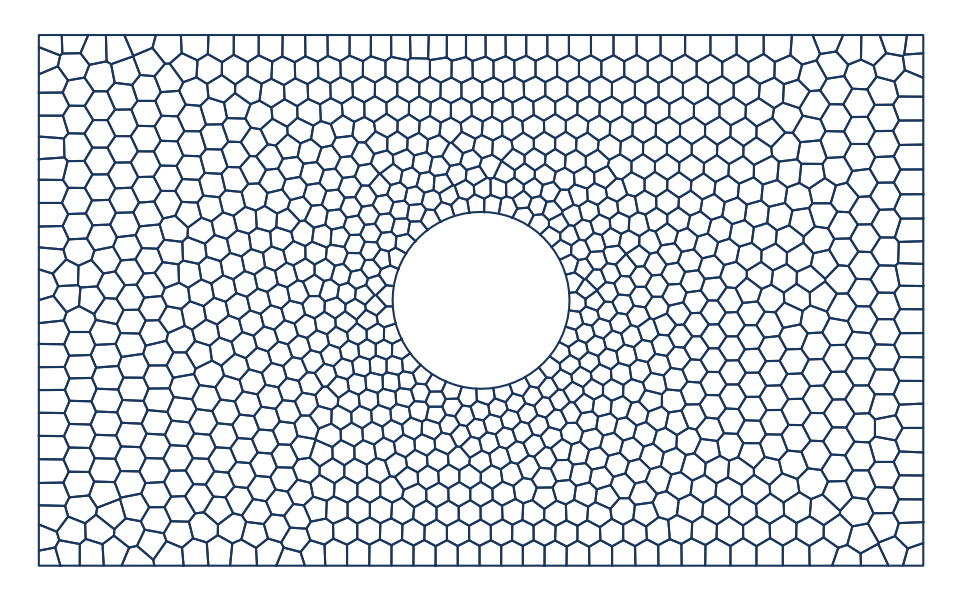

In [48]:
# plate_vorinoirelaxedWithoutDensity = generate_voronoi_cells(polygon=rect_with_hole_Boundary, points=relaxed_pointsPlateWithoutDensity)

# plate_vorinoirelaxed = generate_voronoi_cells(polygon=rect_with_hole_Boundary, points=relaxed_pointsPlate)

plate_vorinoirelaxedWithoutDecay = voronoi_generator.generate_cells(domain=rect_with_hole_Boundary, points=relaxed_pointsPlateWithoutDecay)

# plot_voronoi_cells('plate_voronoirelaxedWithoutDensity.eps', voronoi_cells=plate_vorinoirelaxedWithoutDensity, points=None)

# plot_voronoi_cells('plate_voronoirelaxed.eps', voronoi_cells=plate_vorinoirelaxed, points=None)

plot_voronoi_cells(voronoi_cells=plate_vorinoirelaxedWithoutDecay, figure_name='plate_voronoirelaxedWithoutDecay.eps', dpi=DPI)

### Adjusting cells for non-zero thickness cohesive zone

Applied thickness: 0.2000
Achieved area ratio: 0.6400


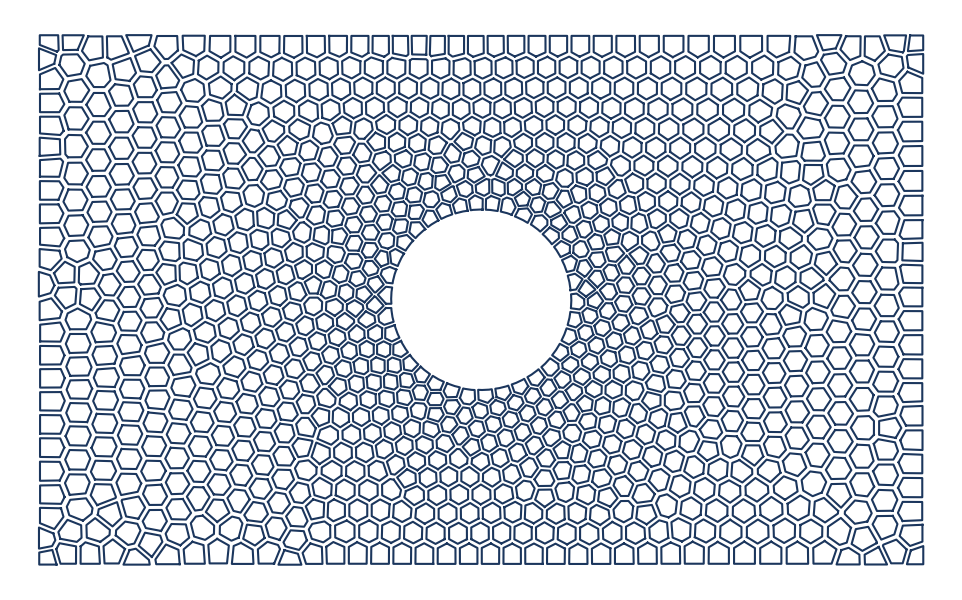

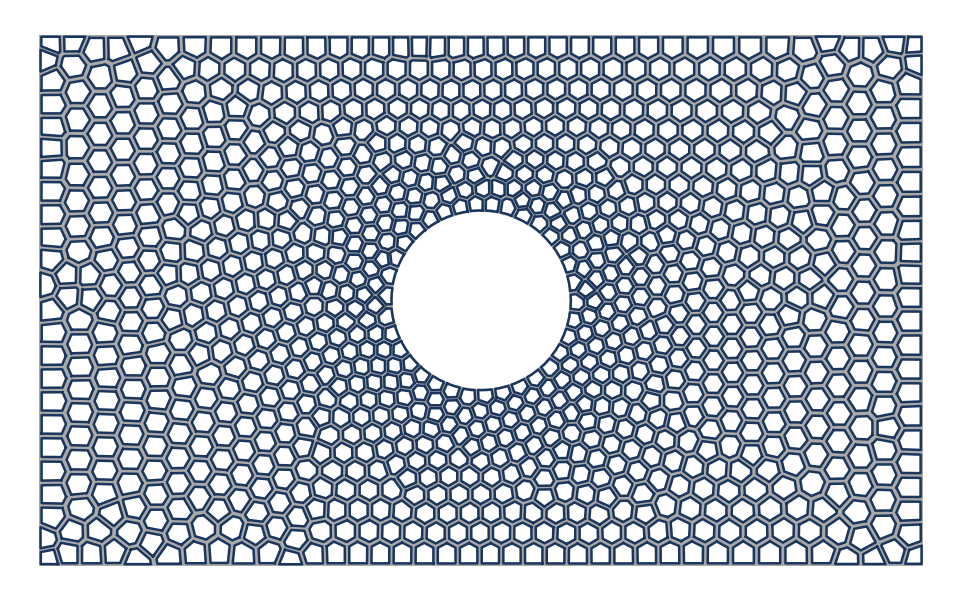

In [54]:
cohesive_adjuster = CohesiveZoneAdjuster(tolerance=0.005, max_iterations=10, verbose=True)
adjusted_rectanglewithHole = cohesive_adjuster.adjust_fixed_thickness(cells=plate_vorinoirelaxedWithoutDecay, thickness=0.2)
plot_voronoi_cells(figure_name='plate_adjustedCells.eps', voronoi_cells=adjusted_rectanglewithHole)
plot_voronoi_cells_with_gaps(
    original_cells=plate_vorinoirelaxedWithoutDecay,
    adjusted_cells=adjusted_rectanglewithHole,
    figure_name='plate_with_gaps.eps',
    gap_color='darkgray', #DC143C
    gap_alpha=1.0,
    cell_color='#1B365D',  # Dark Navy
    cell_width=0.6,
    dpi=DPI
)

# Analysis of Rectangle with corner cut

In [38]:
rect_point1=(0, 0) 
rect_point2=(10, 6) 
circle_center=(10, 3)
circle_radius=1.5

max_density=30.0,    # Maximum density at circle boundary
min_density=5.0,    # Minimum density far from circle
decay_rate=3.0      # Controls how quickly density drops off

rect_with_cornerCut = Geometry.rectangle_with_circular_hole(
            rect_point1=rect_point1, 
            rect_point2=rect_point2, 
            circle_center=circle_center, 
            circle_radius=circle_radius, 
            name='RectWithCentralHole'
          )

rect_with_cornerCut_Boundary = IO.load_polygon_from_file(rect_with_cornerCut)
# plot_boundary_with_points(figure_name='RectWithCornerCutGeometry.png', polygon=rect_with_cornerCut_Boundary)

Note: The circular region intersects with the rectangular region. Cutting out the intersecting portion.


In [39]:
# Initial seed points
N_points = 600
points_seed = 7845
poissonPoints_plateCornerCut = generate_poisson_points(rect_with_cornerCut_Boundary, N_points, points_seed, margin=0.05)

# plot_boundary_with_points(figure_name='PlatewithCornerCutPoissonPoints.png', polygon=rect_with_cornerCut_Boundary, points=poissonPoints_plateCornerCut)


Poisson Disc Sampling completed in 2.29 seconds.
Generated 606 points (target: 600).


In [40]:
# Run the algorithm without the density function
relaxed_pointsPlateWithCornerCutWithoutDensity, metricsPlateWithCornerCutWithoutDensity = lloyd(rect_with_cornerCut_Boundary, poissonPoints_plateCornerCut, density_function=None, max_iterations=10000000, tol=1e-5, use_decay=True, grad_increase_tol=1.4)

Minimum error 6.48942e-04 found at iteration 103
Total time: 3.93187 seconds


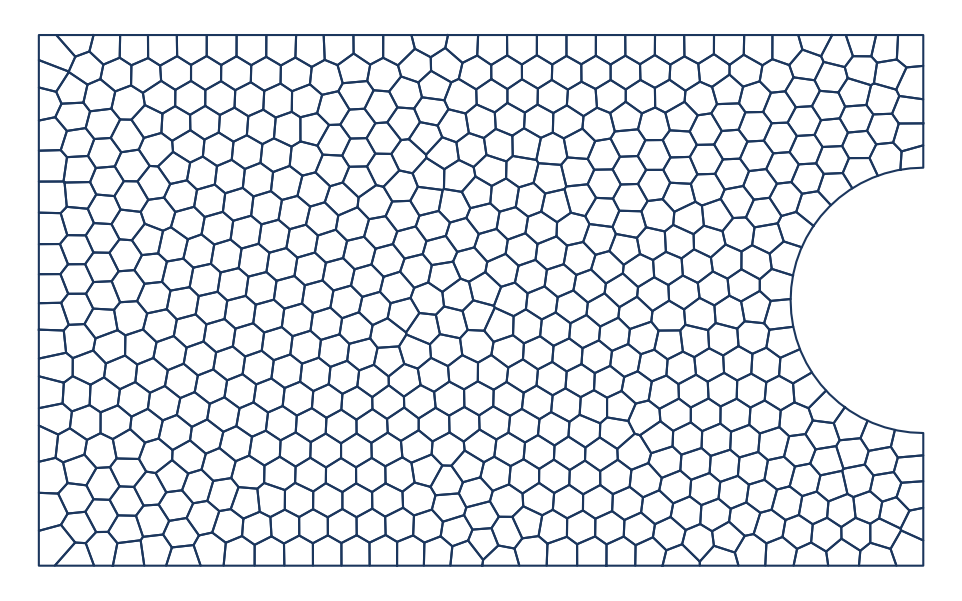

In [55]:
plateWithCornerCut_vorinoirelaxedWithoutDensity = voronoi_generator.generate_cells(domain=rect_with_cornerCut_Boundary, points=relaxed_pointsPlateWithCornerCutWithoutDensity)

# plateWithCornerCut_vorinoirelaxedWithoutDecay = generate_voronoi_cells(polygon=rect_with_cornerCut_Boundary, points=relaxed_pointsPlateWithCornerCutWithoutDecay)

plot_voronoi_cells(figure_name='plateWithCornerCut_voronoirelaxedWithoutDensity.eps', voronoi_cells=plateWithCornerCut_vorinoirelaxedWithoutDensity, dpi=DPI)

# plot_voronoi_cells('plateWithCornerCut_voronoirelaxedWithoutDecay.eps', voronoi_cells=plateWithCornerCut_vorinoirelaxedWithoutDecay, points=None)

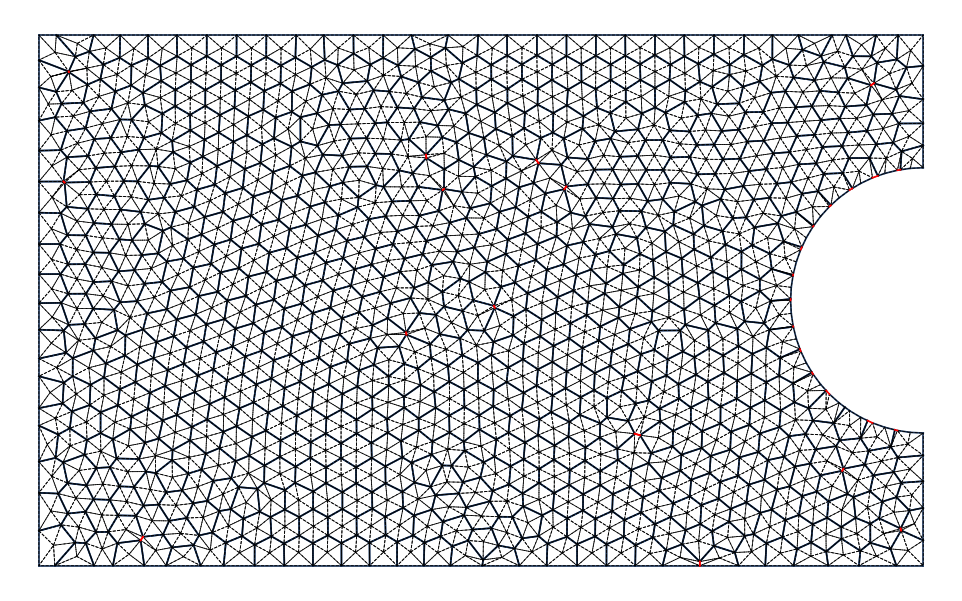

In [56]:
plateWithCornerCut_triangulated = TriangularMesher.triangulateCells_simple(plateWithCornerCut_vorinoirelaxedWithoutDensity)
plot_triangulated_geometry(figure_name='plateWithCornerCut_triangulated.png', geometry=plateWithCornerCut_vorinoirelaxedWithoutDensity, triangulation=plateWithCornerCut_triangulated, highlight_short_edges=True, threshold=0.065, triangle_style='--', dpi=DPI)

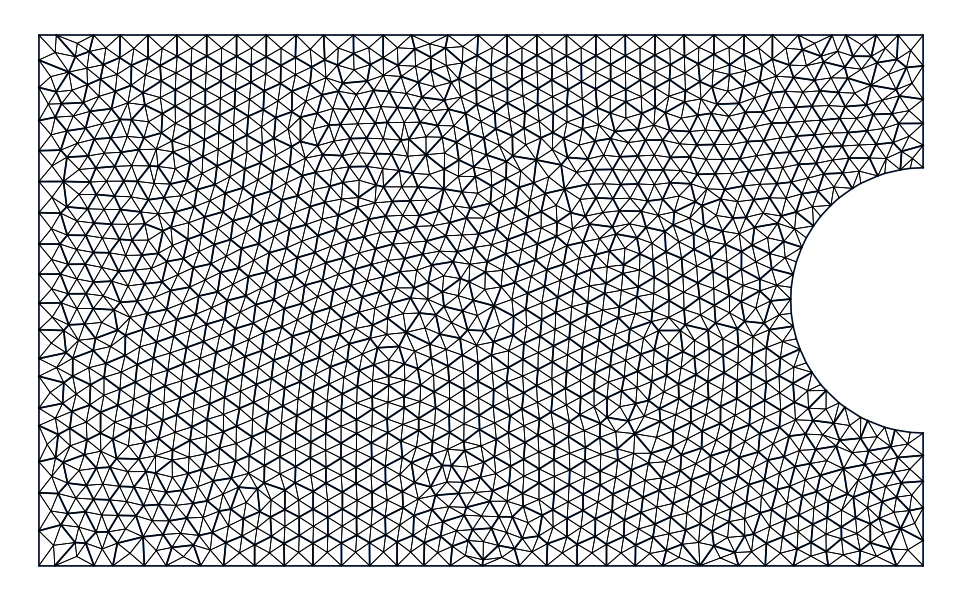

In [57]:
plateWithCornerCut_OptimizedVoronoi = optimizer.optimize_voronoi_cells(voronoi_cells=plateWithCornerCut_vorinoirelaxedWithoutDensity, threshold=0.066)
plateWithCornerCut_triangulatedOptimized = TriangularMesher.triangulateCells_simple(plateWithCornerCut_OptimizedVoronoi)
plot_triangulated_geometry(figure_name='plateWithCornerCut_triangulatedOptimized.png', geometry=plateWithCornerCut_OptimizedVoronoi, triangulation=plateWithCornerCut_triangulatedOptimized, dpi=DPI)

### Analysis of Nacre Layer

In [45]:
rectangle = Geometry.rectangle(width=8400, height=8400)
rectangleBoundary = IO.load_polygon_from_file(rectangle)

# Initial seed points
N_points = 144
points_seed = 7845
poissonPoints_rectangle = generate_poisson_points(rectangleBoundary, N_points, points_seed, margin=50, tolerance=0.001)

# plot_boundary_with_points(figure_name='RectanglePoissonPoints.png', polygon=rectangleBoundary, points=poissonPoints_rectangle)



Poisson Disc Sampling completed in 0.49 seconds.
Generated 144 points (target: 144).


In [46]:
relaxedPoissonpoints_rectangle, _ = lloyd(rectangleBoundary, poissonPoints_rectangle, grad_increase_tol=1.5)
rectangle_Voronoi = voronoi_generator.generate_cells(domain=rectangleBoundary, points=relaxedPoissonpoints_rectangle)
# plot_voronoi_cells(voronoi_cells=rectangle_Voronoi, figure_name='Rectangle_Voronoi.png')

Minimum error 5.99570e-04 found at iteration 128
Total time: 1.17780 seconds


Applied thickness: 0.0900
Achieved area ratio: 0.8281
Saving triangular mesh to: meshFiles\RectangleVoronoi_mesh.obj
Using format 'obj' for extension 'obj'
Successfully saved triangular mesh to: meshFiles\RectangleVoronoi_mesh.obj


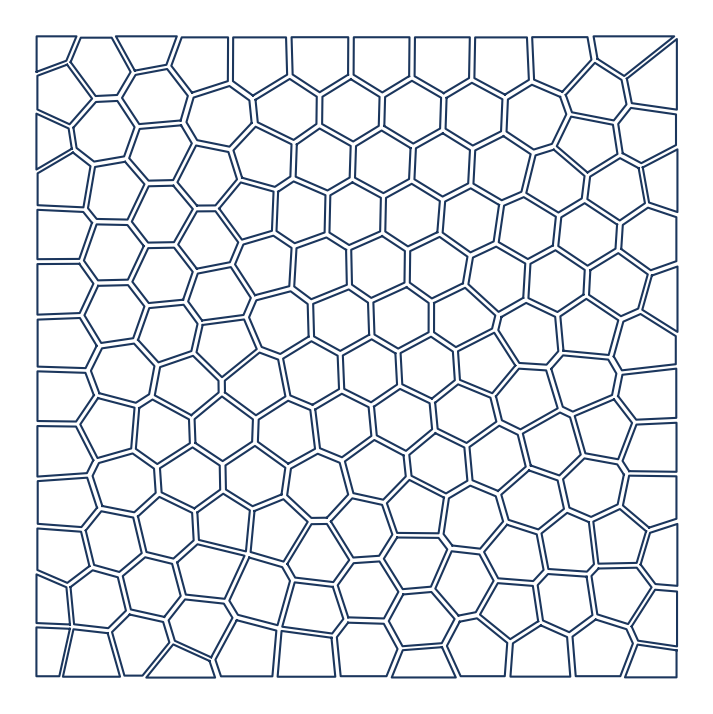

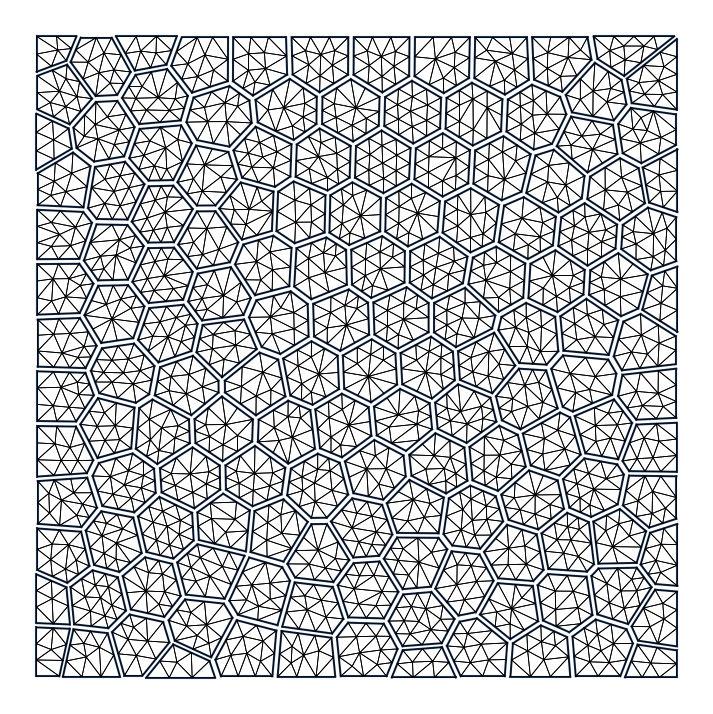

In [58]:
rectangle_VoronoiOptimzed = optimizer.optimize_voronoi_cells(voronoi_cells=rectangle_Voronoi, threshold=140)
rectangle_VoronoiAdjusted = cohesive_adjuster.adjust_fixed_thickness(cells=rectangle_VoronoiOptimzed, thickness=0.09)

# For finer mesh
rectangle_VoronoiTriangulatedFiner = triangulate_geometry(geometry=rectangle_VoronoiAdjusted, min_edge_length=300, save_mesh=True, filename='RectangleVoronoi_mesh.obj', output_dir='meshFiles')

plot_voronoi_cells(voronoi_cells=rectangle_VoronoiAdjusted, figure_name='Rectangle_VoronoiOptimized.eps', dpi=DPI)
# plot_triangulated_cells(rectangle_VoronoiAdjusted, rectangle_VoronoiTriangulated, 'Rectangle_VoronoiTriangulated.eps')
plot_triangulated_geometry(geometry=rectangle_VoronoiAdjusted, triangulation=rectangle_VoronoiTriangulatedFiner, figure_name='Rectangle_VoronoiTriangulatedFiner.eps', triangle_style='-', cell_width=0.5, dpi=DPI) # #DC143C

## Analysis of Hexagonal Donain

#### The density function

In [59]:
# Define the density function
import numpy as np
def hexagonDensity(x, y):
    return np.exp(-20 * (x**2 + y**2)) + 0.05 * np.sin(np.pi * x)**2 * np.sin(np.pi * y)**2

In [60]:
hexagon = Geometry.hexagon((0, 0), radius=5, name='Hexagon')
hexagon_Boundary = IO.load_polygon_from_file(hexagon)
# plot_boundary_with_points(figure_name='RectWithHoleGeometry.png', polygon=hexagon_Boundary, dpi=DPI)

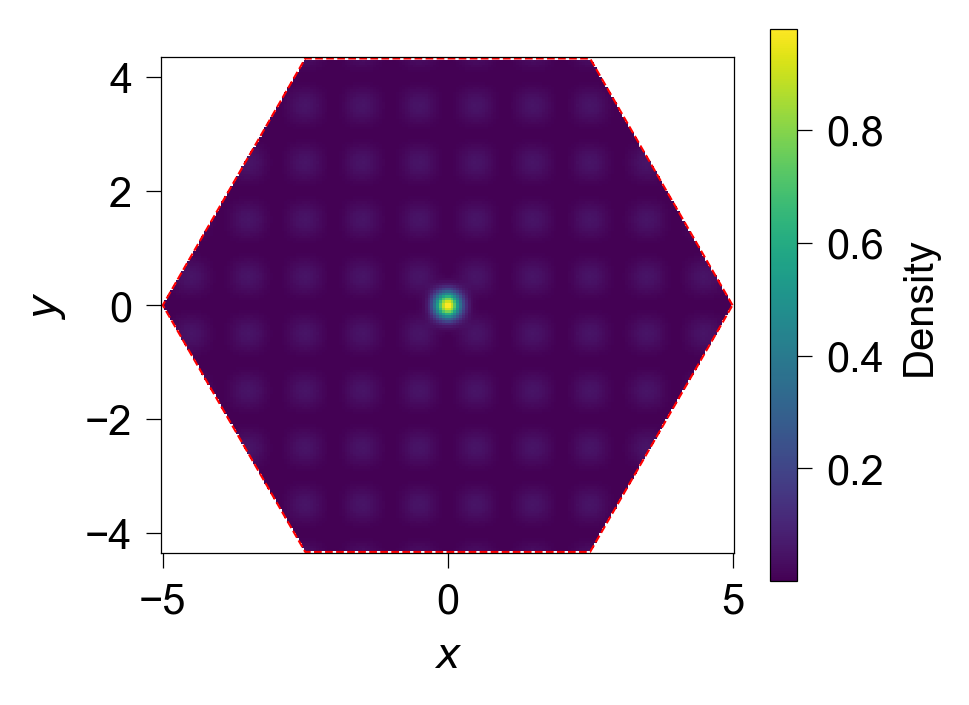

The PostScript backend does not support transparency; partially transparent artists will be rendered opaque.


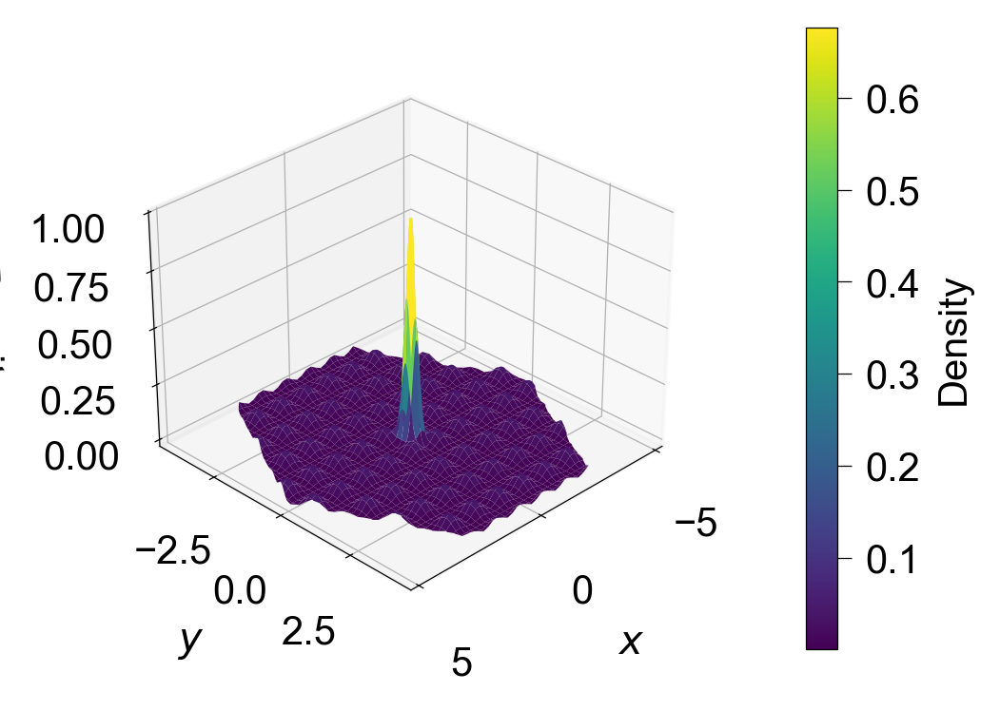

In [61]:
plot_density_hexagon(hexagon_geometry=hexagon, density_function=hexagonDensity, resolution=200, figure_name='hexagonDensity.eps', dpi=DPI)

In [65]:
# Initial seed points
N_points = 2000
points_seed = 7845
poissonPoints_hexagon = generate_poisson_points(hexagon_Boundary, N_points, points_seed, margin=0.05)

# plot_boundary_with_points(figure_name='HexagonwithPoissonPoints.png', polygon=hexagon_Boundary, points=poissonPoints_hexagon, dpi=DPI)


Poisson Disc Sampling completed in 7.48 seconds.
Generated 2003 points (target: 2000).


In [66]:
# Run the algorithm without the density function
relaxed_pointsHexagonWithoutDensity, metricsHexagonWithoutDensity = lloyd(polygon=hexagon_Boundary, seed_points=poissonPoints_hexagon, density_function=None, max_iterations=10000000, tol=1e-5, use_decay=True, grad_increase_tol=1.4)

Minimum error 4.63246e-04 found at iteration 195
Total time: 25.37486 seconds


In [67]:
# Run the algorithm without the density function
relaxed_pointsHexagonWithDensityWithoutDecay, metricsHexagonWithDensityWithoutDecay = lloyd(polygon=hexagon_Boundary, seed_points=poissonPoints_hexagon, density_function=hexagonDensity, max_iterations=10000000, tol=1e-5, use_decay=False, grad_increase_tol=1.5)

Minimum error 1.31254e-03 found at iteration 413
Total time: 2559.73802 seconds


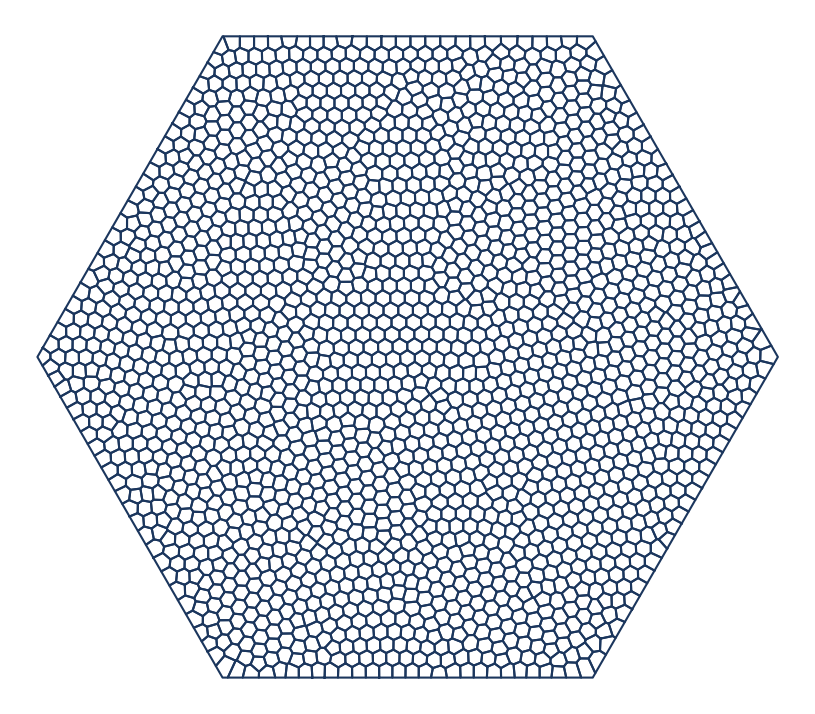

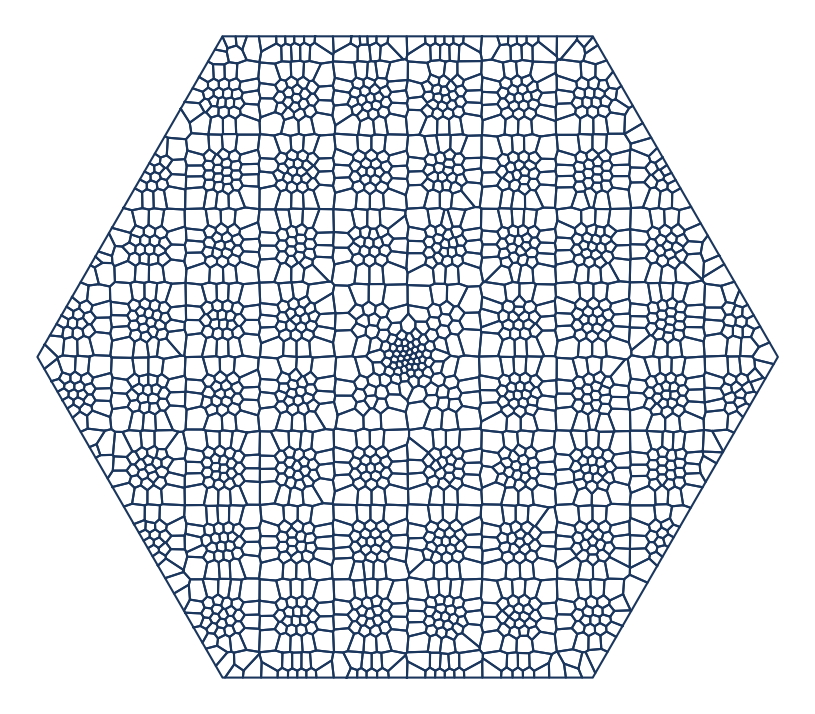

In [68]:
hexagon_vorinoirelaxedWithoutDensity = voronoi_generator.generate_cells(domain=hexagon_Boundary, points=relaxed_pointsHexagonWithoutDensity)

hexagon_vorinoirelaxedWithDensityWithoutDecay = voronoi_generator.generate_cells(domain=hexagon_Boundary, points=relaxed_pointsHexagonWithDensityWithoutDecay)

plot_voronoi_cells(figure_name='hexagon_voronoirelaxedWithoutDensity.eps', voronoi_cells=hexagon_vorinoirelaxedWithoutDensity, dpi=DPI)

plot_voronoi_cells(figure_name='hexagon_voronoirelaxedWithoutDecay.eps', voronoi_cells=hexagon_vorinoirelaxedWithDensityWithoutDecay, dpi=DPI)